<a href="https://colab.research.google.com/github/JRKagumba/biomechanical-analysis/blob/main/02_OpenPose_TimeSeries_PreProcessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
keywords_dict = {
      0 : 'NOSE',
      1 : 'NECK',
      2 : 'RSHO',
      3 : 'RELB',
      4 : 'RWRI',
      5 : 'LSHO',
      6 : 'LELB',
      7 : 'LWRI',
      8 : 'MHIP',
      9 : 'RHIP',
      10 : 'RKNE',
      11 : 'RANK',
      12 : 'LHIP',
      13 : 'LKNE',
      14 : 'LANK',
      15 : 'REYE',
      16 : 'LEYE',
      17 : 'REAR',
      18 : 'LEAR',
      19 : 'LBTO',
      20 : 'LSTO',
      21 : 'LHEL',
      22 : 'RBTO',
      23 : 'RSTO',
      24 : 'RHEL'
}
print("DONE: Short keywords assigned")

DONE: Short keywords assigned


In [28]:
import io
import base64
from IPython.display import HTML

def show_local_mp4_video(file_name, width=640, height=480):
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

In [34]:
file_path = '/content/gdrive/MyDrive/ColabNotebooks/BiomechanicsAnalysis/sample_activity_outputs_openpose/06_workouts/burpees/burpees_01/burpees_01.mp4'

show_local_mp4_video(file_path, width=960, height=720)

## Pre-processing

In [35]:
import pandas as pd

sample_csv_path = '/content/gdrive/MyDrive/ColabNotebooks/BiomechanicsAnalysis/sample_activity_outputs_openpose/06_workouts/burpees/burpees_01/burpees_01.csv'

df = pd.read_csv(sample_csv_path, index_col=0)

df

,0,1,2,3,4,5,6,7,8,9,...,65,66,67,68,69,70,71,72,73,74
0,462.817,490.309,0.934288,515.718,464.863,0.757452,513.778,453.036,0.684239,480.557,...,0.801171,601.900,635.271,0.465642,603.831,633.330,0.468863,652.901,617.509,0.438597
1,464.831,486.371,0.857483,525.639,466.805,0.768893,527.505,454.997,0.669728,494.131,...,0.713356,600.028,637.212,0.276655,601.966,635.283,0.303396,656.810,617.612,0.453278
2,468.708,480.549,0.858779,537.253,464.878,0.763162,537.255,451.108,0.684802,494.161,...,0.689228,603.912,652.872,0.092458,0.000,0.000,0.000000,652.948,613.674,0.287153
3,476.527,478.565,0.948462,541.252,464.865,0.774484,541.202,451.128,0.706968,507.922,...,0.709188,602.001,648.994,0.165068,0.000,0.000,0.000000,650.938,617.582,0.182012
4,476.545,474.552,0.889162,545.158,464.810,0.749124,547.070,453.061,0.679964,513.770,...,0.779212,601.957,645.043,0.291247,603.826,639.165,0.309281,649.022,617.668,0.266446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
963,511.901,176.864,0.874147,562.776,225.859,0.694228,556.908,225.724,0.596117,552.995,...,0.733554,507.877,613.719,0.790242,507.861,603.926,0.717157,556.838,572.635,0.732669
964,511.893,176.811,0.872889,562.765,225.750,0.697035,556.951,223.843,0.556736,558.857,...,0.733215,505.887,615.647,0.816357,505.884,604.001,0.729752,555.003,580.374,0.786986
965,511.888,176.811,0.875971,562.780,223.845,0.687267,560.794,221.892,0.528216,556.870,...,0.727857,498.112,615.703,0.810358,500.049,605.869,0.688975,554.891,586.227,0.847836
966,511.881,178.690,0.886050,562.748,223.868,0.673415,560.810,223.788,0.521632,556.917,...,0.697902,494.145,615.703,0.873619,494.217,605.891,0.740820,552.930,588.209,0.852127


In [36]:
# Replace column names to represent keypoints

import json

name_replace_dict={}

for col in df.columns:
    axis = (int(col)) % 3

    axis_dict = {0:'X', 1:'Y', 2:'Prob'} 
    axis_var = axis_dict[axis]

    keypoint = (int(col)) // 3
    keypoint_var = keywords_dict[keypoint]

    name_replace_dict[col] = f'{keypoint_var}_{axis_var}'


# print(json.dumps(name_replace_dict, indent=4, sort_keys=False))

df=df.rename(columns=name_replace_dict)

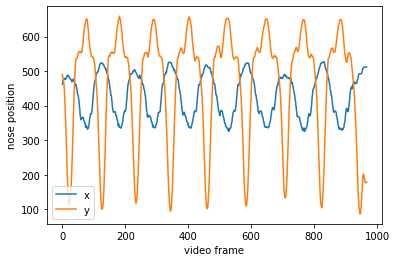

In [37]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker 

plt.plot(df['NOSE_X'])
plt.plot(df['NOSE_Y'])
# plt.plot(df['NOSE_Prob'])
plt.xlabel("video frame")
plt.ylabel("nose position")
plt.legend(('x','y'))

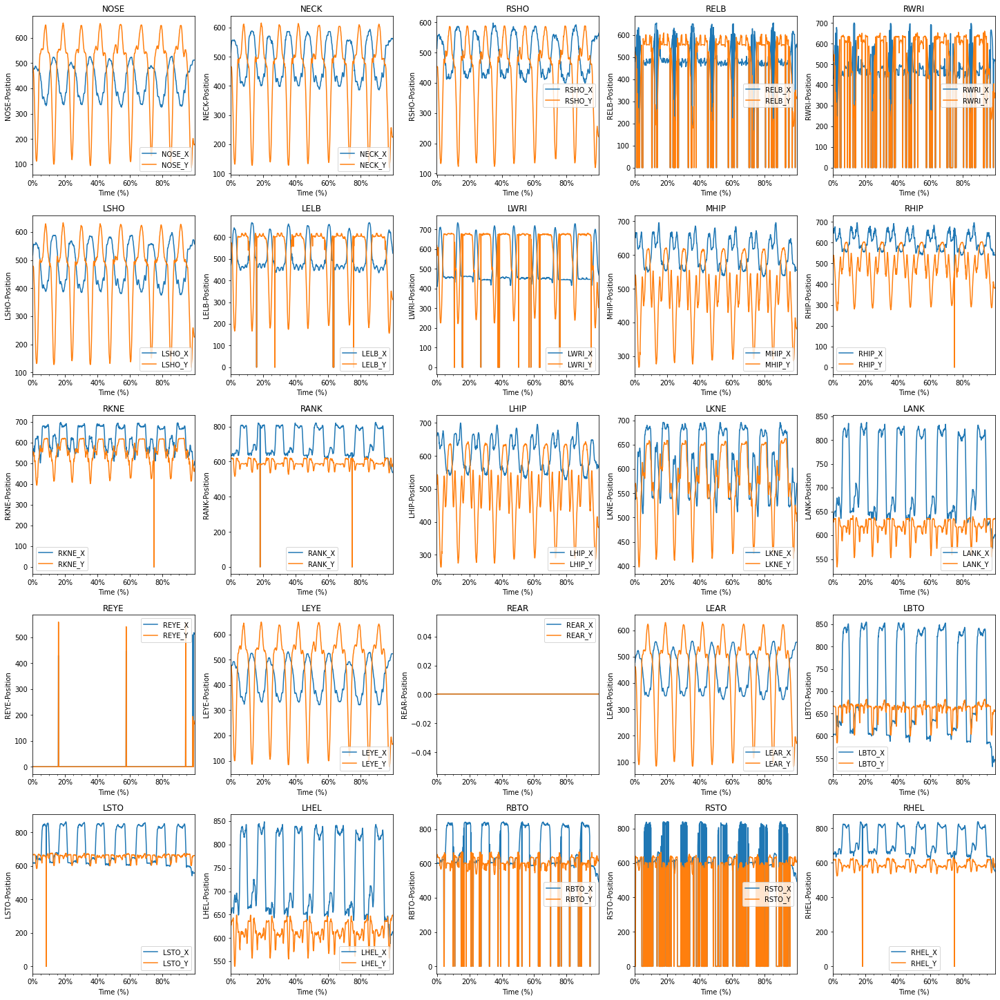

In [38]:
fig, axs = plt.subplots(5, 5, figsize=(20, 20), constrained_layout=True)


for ax, val in zip(axs.flat, keywords_dict.values()):

    ax.set_title(f'{val}')
    ax.set_xlabel('Time (%)', fontsize=10)
    ax.set_ylabel(f'{val}-Position', fontsize=10)

    ax.plot(df[f'{val}_X'], label=f'{val}_X')
    ax.plot(df[f'{val}_Y'], label=f'{val}_Y')

    ax.legend()
    ax.margins(x=0.001)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(len(df)/5))
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(len(df)/20))
    ax.xaxis.set_major_formatter(ticker.PercentFormatter(xmax=len(df)))
